In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0" 
# os.environ['http_proxy'] = 'http://10.16.35.10:13390' 
# os.environ['https_proxy'] = 'http://10.16.35.10:13390' 

import torch
from torch import nn
import torch.nn.functional as F

import sys
sys.path.append('..')
from prior_networks import UViT_Clip
from prior_pipe import PriorPipe
# from dataset import *
from utils import *

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# load prior diffusion

In [2]:
diffusion_prior = UViT_Clip(embed_dim=512, num_heads=8, mlp_ratio=4)
# number of parameters
sum(p.numel() for p in diffusion_prior.parameters() if p.requires_grad)
pipe = PriorPipe(diffusion_prior, device=device)
# load pretrained model
model_name = 'uvit_vice_pred_imagenet' 
path = f'../ckpts/{model_name}'
pipe.diffusion_prior.load_state_dict(torch.load(f'{path}.pt'))
# pipe.ema.load_state_dict(torch.load(f'{path}_ema.pt'))

<All keys matched successfully>

# load sd

In [3]:
# extract image features
from diffusers.utils import load_image
from IPython.display import Image, display
from customized_pipe import Generator4Embeds, encode_image
from transformers import CLIPVisionModelWithProjection, CLIPImageProcessor
import torch

feature_extractor = CLIPImageProcessor()
image_encoder = CLIPVisionModelWithProjection.from_pretrained(
    "h94/IP-Adapter", 
    subfolder="models/image_encoder",
    torch_dtype=torch.float16,
).to("cuda")

pipe_image = Generator4Embeds(path='stabilityai/sdxl-turbo', num_inference_steps=4)
# pipe_image = Generator4Embeds(path='stabilityai/stable-diffusion-xl-base-1.0', num_inference_steps=25)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [4]:
pipe_image.pipe.feature_extractor = feature_extractor
pipe_image.pipe.image_encoder = image_encoder

In [5]:
from diffusers.schedulers import DDPMScheduler
scheduler = DDPMScheduler(
    thresholding=False,
    clip_sample=False,
)
pipe.scheduler = scheduler
print((
    pipe.scheduler.config.thresholding, 
    pipe.scheduler.config.sample_max_value, 
    pipe.scheduler.config.clip_sample,
    pipe.scheduler.config.clip_sample_range
))

(False, 1.0, False, 1.0)


# load concept encoder

In [6]:
# Load concept encoder
from networks import SimpleRegProb
# concept_encoder = MLPProb(1024, 42, l1=0.01).to(device)
concept_encoder = SimpleRegProb(1024, 42, l1=0).to(device)
path_save = os.path.join('../ckpts', 'emb_predict_SimpleReg.pt')
concept_encoder.load_state_dict(torch.load(path_save)['parameters'])

<All keys matched successfully>

In [7]:
from diffusers.utils import load_image, make_image_grid

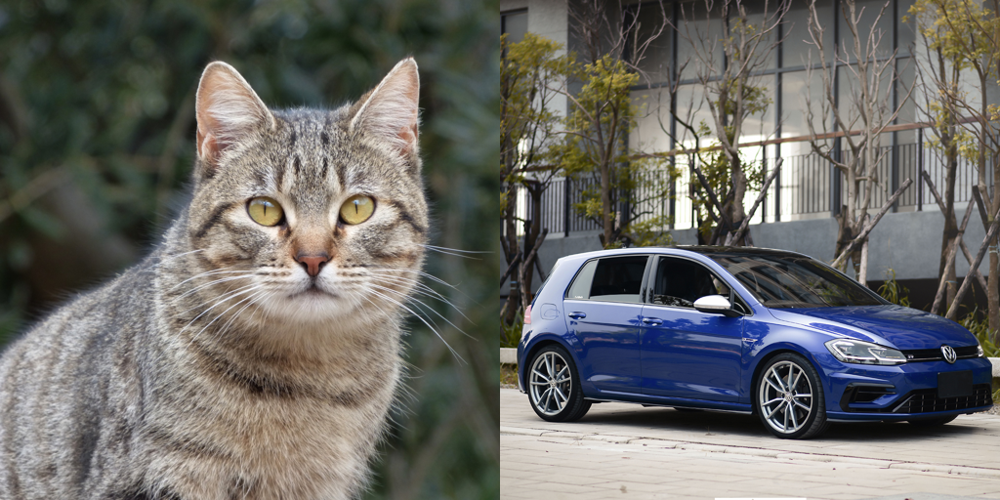

In [8]:
# extract a concept embedding
image_prompt = load_image("../images/cat.jpg")
image_prompt2 = load_image("../images/car.jpg")
# image_prompt = load_image("https://image-cdn.hypb.st/https%3A%2F%2Fhypebeast.com%2Fwp-content%2Fblogs.dir%2F6%2Ffiles%2F2022%2F10%2Fstudio-ghibli-hayao-miyazaki-new-movie-almost-finished-1.jpg?cbr=1&q=90")
from IPython.display import display
image_embeds = encode_image([image_prompt, image_prompt2], image_encoder, feature_extractor)
concept_embeds = concept_encoder(image_embeds.float())   
display(make_image_grid([image_prompt, image_prompt2], rows=1, cols=2, resize=512))

# Experiments

In [9]:
property_features = torch.load(os.path.join('../ckpts', 'property_features.pt'))
word_emb = property_features['text_features']
word_list = property_features['text']
label_concept = torch.load(os.path.join('../ckpts', 'label_dim.pt'))

## probability path

### only high-level smoothness

In [13]:
num = 8
probabilities = torch.linspace(1, 0, steps=num, device=device)

seed_value = 0
generators = [torch.Generator(device=device).manual_seed(1) for _ in range(num)]
for generator in generators:
    generator.manual_seed(seed_value)

from guidance_set import get_loss_smooth, get_loss_probability, fns_collector
# Adjust loss functions to handle batched input
loss_smooth = get_loss_smooth(n_diag=3, threshold=1)
loss_probability = get_loss_probability(
    concept_encoder, probabilities, image_embeds.float()
)

loss_func = fns_collector(
    fns=[
        loss_probability,
        loss_smooth,
    ],
    scales=[10., 0.]
)


# Generate all embeddings in one pass
h = pipe.generate_guidance(
    loss_fn=loss_func,
    num_inference_steps=50,
    num_resampling_steps=5,
    guidance_scale=0.1,
    generator=generators,
    use_ema=False,
    latent=None,
    strength=1,
    N=num,
    shape=(1024,)
)

# Generate all images in parallel
pipe_image.pipe.set_ip_adapter_scale(1)

images = pipe_image.generate(
    h.to(dtype=torch.float16),
    generator=generators,
)


50it [00:05,  8.79it/s]
/home/weichen/miniconda3/envs/sd/lib/python3.11/site-packages/diffusers/configuration_utils.py:139: FutureWarning: Accessing config attribute `_name_or_path` directly via 'StableDiffusionXLPipeline' object attribute is deprecated. Please access '_name_or_path' over 'StableDiffusionXLPipeline's config object instead, e.g. 'scheduler.config._name_or_path'.
  deprecate("direct config name access", "1.0.0", deprecation_message, standard_warn=False)


  0%|          | 0/4 [00:00<?, ?it/s]

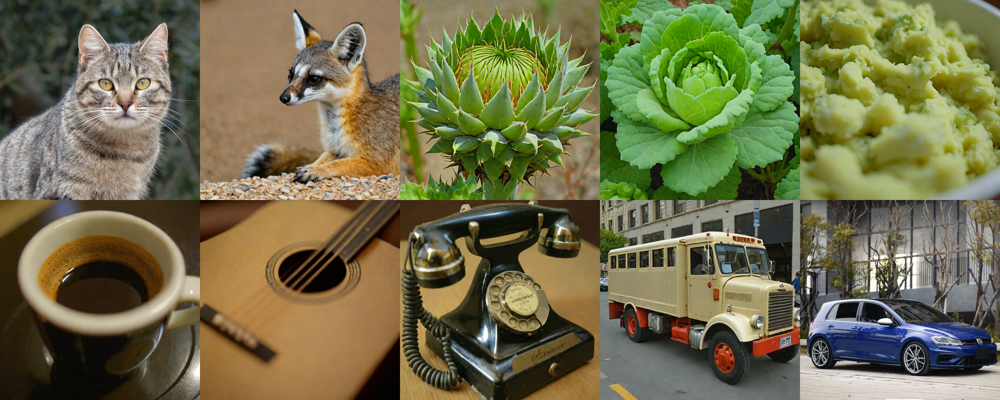

In [14]:
display(make_image_grid([image_prompt, *images, image_prompt2], rows=2, cols=5, resize=512))


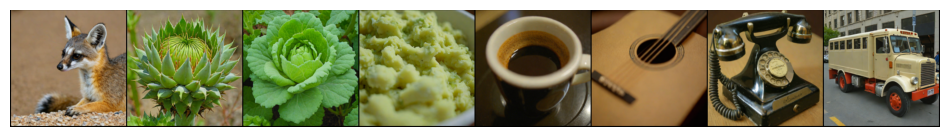

In [15]:
plot_indices_grid(images, shape=(1,8))

In [ ]:
num = 8
probabilities = torch.linspace(1, 0, steps=num, device=device)

seed_value = 0
generators = [torch.Generator(device=device).manual_seed(1) for _ in range(num)]
for generator in generators:
    generator.manual_seed(seed_value)

from guidance_set import get_loss_smooth, get_loss_probability, fns_collector
# Adjust loss functions to handle batched input
loss_smooth = get_loss_smooth(n_diag=3, threshold=1)
loss_probability = get_loss_probability(
    concept_encoder, probabilities, image_embeds.float()
)

loss_func = fns_collector(
    fns=[
        loss_probability,
        loss_smooth,
    ],
    scales=[10., 0.5]
)


# Generate all embeddings in one pass
h = pipe.generate_guidance(
    loss_fn=loss_func,
    num_inference_steps=50,
    num_resampling_steps=5,
    guidance_scale=0.1,
    generator=generators,
    use_ema=False,
    latent=None,
    strength=1,
    N=num,
    shape=(1024,)
)

# Generate all images in parallel
pipe_image.pipe.set_ip_adapter_scale(1)

images = pipe_image.generate(
    h.to(dtype=torch.float16),
    generator=generators,
)


50it [00:05,  8.79it/s]
/home/weichen/miniconda3/envs/sd/lib/python3.11/site-packages/diffusers/configuration_utils.py:139: FutureWarning: Accessing config attribute `_name_or_path` directly via 'StableDiffusionXLPipeline' object attribute is deprecated. Please access '_name_or_path' over 'StableDiffusionXLPipeline's config object instead, e.g. 'scheduler.config._name_or_path'.
  deprecate("direct config name access", "1.0.0", deprecation_message, standard_warn=False)


  0%|          | 0/4 [00:00<?, ?it/s]

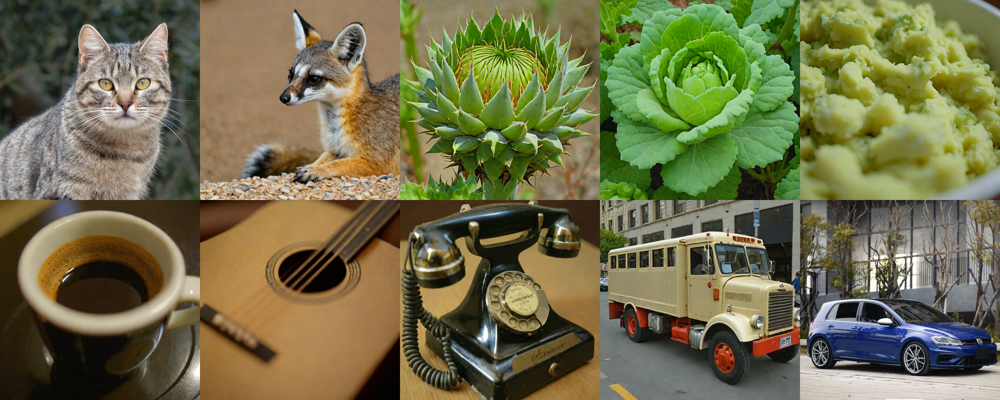

In [ ]:
display(make_image_grid([image_prompt, *images, image_prompt2], rows=2, cols=5, resize=512))


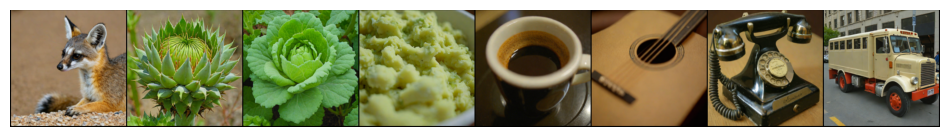

In [ ]:
plot_indices_grid(images, shape=(1,8))

In [16]:
# concept_embeds_h = concept_encoder(h.float()) 
# # concept_embeds_pred = concept_encoder(image_embeds_pred.float()) 
# # values of the concept edited across the batch
# ## (B, len(concept_dims))
# values_gen = concept_embeds_h[:, ind_concept_edited].detach().cpu()
# values_gen = values_gen.tolist()

In [16]:
c_pre = concept_encoder(h.float())
c_refs = concept_encoder(image_embeds.float())
similarity = c_pre @ c_refs.T
prob_pre = similarity.softmax(dim=-1)
prob_pre1 = prob_pre[:, 0]
prob_pre2 = prob_pre[:, 1]
prob_pre1, prob_pre2 = prob_pre1.tolist(), prob_pre2.tolist()
prob = [[prob_pre1[i], prob_pre2[i]] for i in range(len(prob_pre1))]

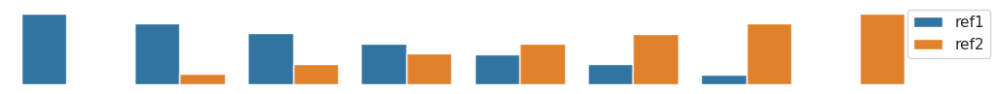

In [17]:
import seaborn as sns
import matplotlib.pyplot as plt

xticks = list(range(8))

# create df for barplot, with xticks, value and concept
df = pd.DataFrame({'xticks': [i for i in xticks for _ in range(2)], 'prob': [i for p in prob for i in p], 'ref': ["ref1","ref2"]*8})

# 创建折线图
sns.set(style="whitegrid")  # 设置Seaborn样式

plt.figure(figsize=(12, 1.))

# 绘制折线图
ax = sns.barplot(x='xticks', y='prob', hue='ref', data=df, palette="tab10")



sns.despine(left=True, bottom=True)  # 移除左边和底部的轴线和边框

plt.xticks([])
plt.yticks([])
plt.xlabel('')
plt.ylabel('')

plt.legend(bbox_to_anchor=(0.99,1), loc=2, borderaxespad=0.)
plt.show()

### high-level + low-level smoothness

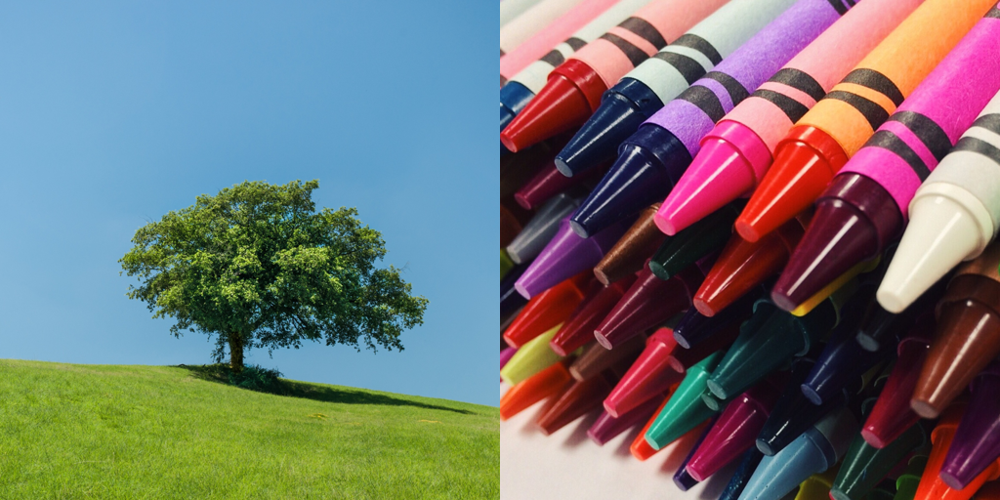

In [26]:
# extract a concept embedding
image_prompt = load_image("../images/tree.jpg")
image_prompt2 = load_image("../images/crayon.jpg")
# image_prompt = load_image("https://image-cdn.hypb.st/https%3A%2F%2Fhypebeast.com%2Fwp-content%2Fblogs.dir%2F6%2Ffiles%2F2022%2F10%2Fstudio-ghibli-hayao-miyazaki-new-movie-almost-finished-1.jpg?cbr=1&q=90")
from IPython.display import display
image_embeds = encode_image([image_prompt, image_prompt2], image_encoder, feature_extractor)
concept_embeds = concept_encoder(image_embeds.float())   
display(make_image_grid([image_prompt, image_prompt2], rows=1, cols=2, resize=512))

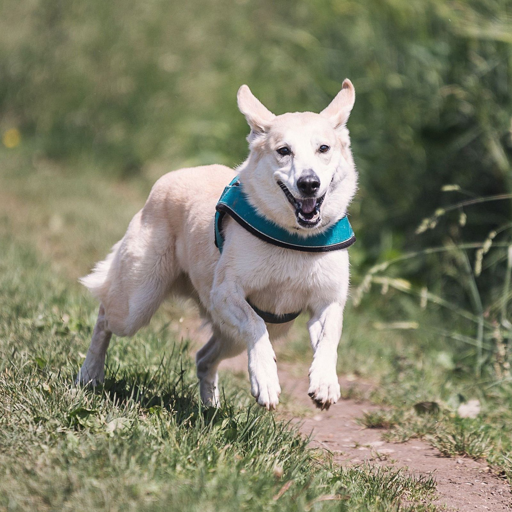

In [20]:
# extract a concept embedding
image_prompt3 = load_image("../images/dog.jpg")
display(make_image_grid([image_prompt3], rows=1, cols=1, resize=512))

In [23]:
num = 8
probabilities = torch.linspace(1, 0, steps=num, device=device)

seed_value = 1
generators = [torch.Generator(device=device).manual_seed(1) for _ in range(num)]
for generator in generators:
    generator.manual_seed(seed_value)

# Adjust loss functions to handle batched input
loss_smooth = get_loss_smooth(n_diag=3, threshold=1)
loss_probability = get_loss_probability(
    concept_encoder, probabilities, image_embeds.float()
)

loss_func = fns_collector(
    fns=[
        loss_probability,
        loss_smooth,
    ],
    scales=[10., 1.]
)


# Generate all embeddings in one pass
h = pipe.generate_guidance(
    loss_fn=loss_func,
    num_inference_steps=50,
    num_resampling_steps=5,
    guidance_scale=0.1,
    generator=generators,
    use_ema=False,
    latent=None,
    strength=1,
    N=num,
    shape=(1024,)
)

# Generate all images in parallel
pipe_image.pipe.set_ip_adapter_scale(1)

from diffusers import AutoPipelineForText2Image, AutoPipelineForImage2Image
pipe_image.pipe = AutoPipelineForImage2Image.from_pipe(pipe_image.pipe).to("cuda")
images = []
for i in range(num):
    generators[i].manual_seed(seed_value)
    image = pipe_image.generate(
        h[i:i+1].to(dtype=torch.float16),
        image=image_prompt3.resize((512, 512)),
        strength=0.5, 
        generator=generators[i],
    )
    images.append(image[0])


50it [00:05,  8.80it/s]


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

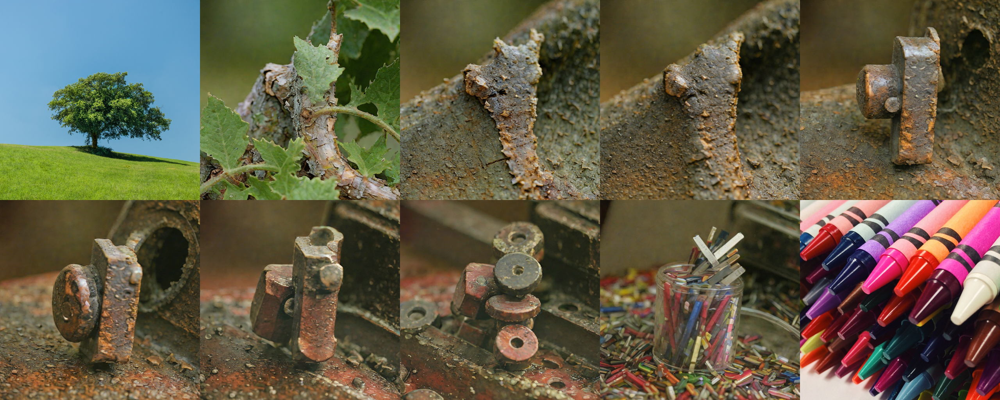

In [27]:
display(make_image_grid([image_prompt, *images, image_prompt2], rows=2, cols=5, resize=512))

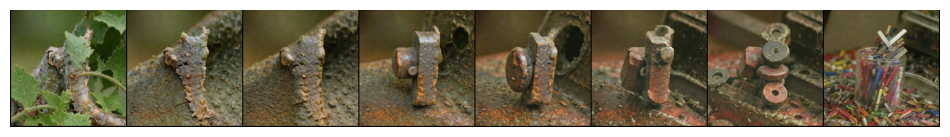

In [25]:
plot_indices_grid(images, shape=(1,8))

In [28]:
c_pre = concept_encoder(h.float())
c_refs = concept_encoder(image_embeds.float())
similarity = c_pre @ c_refs.T
prob_pre = similarity.softmax(dim=-1)
prob_pre1 = prob_pre[:, 0]
prob_pre2 = prob_pre[:, 1]
prob_pre1, prob_pre2 = prob_pre1.tolist(), prob_pre2.tolist()
prob = [[prob_pre1[i], prob_pre2[i]] for i in range(len(prob_pre1))]

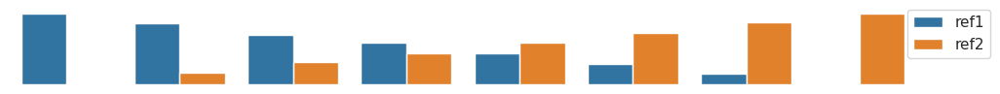

In [29]:
import seaborn as sns
import matplotlib.pyplot as plt

xticks = list(range(8))

# create df for barplot, with xticks, value and concept
df = pd.DataFrame({'xticks': [i for i in xticks for _ in range(2)], 'prob': [i for p in prob for i in p], 'ref': ["ref1","ref2"]*8})

# 创建折线图
sns.set(style="whitegrid")  # 设置Seaborn样式

plt.figure(figsize=(12, 1.))

# 绘制折线图
ax = sns.barplot(x='xticks', y='prob', hue='ref', data=df, palette="tab10")



sns.despine(left=True, bottom=True)  # 移除左边和底部的轴线和边框

plt.xticks([])
plt.yticks([])
plt.xlabel('')
plt.ylabel('')

plt.legend(bbox_to_anchor=(0.99,1), loc=2, borderaxespad=0.)
plt.show()